<center> <font size="6"> <b> Customized Resilience Inference Measurement Model </b> </font> </center>
<br>

<center><font size="3"> <b>Authors</b> : Debayan Mandal <sup>1</sup>, Dr. Lei Zou <sup>1,*</sup>, Joynal Abedin<sup>1</sup>, Bing Zhou<sup>1</sup>, Mingzheng Yang<sup>1</sup>, Binbin Lin<sup>1</sup>, Dr. Heng Cai<sup>2</sup> </font></center>
<br>

<font size="3"> <sup> 1 </sup> Geospatial Exploration and Resolution (GEAR) Lab, Department of Geography, College of Geosciences, Texas A &amp; M University </font> <br>
<font size="3"> <sup> 2 </sup> Department of Geography, College of Geosciences, Texas A &amp; M University </font> <br>
<font size="3"> <sup> * </sup> Corresponding author: lzou@tamu.edu <br>

[Geospatial Exploration and Resolution (GEAR) Lab](https://www.geoearlab.com) <br /><br />
You can checkout the paper here: 

---

# Introduction

Resilience assessment and improvement have become increasingly important in today's world, where natural and man-made disasters are becoming more frequent and severe. Cities, communities, and organizations are recognizing the need to prepare for and mitigate the impacts of disasters and disruptions, and there is a growing body of research and practice on resilience assessment and improvement.

One significant research gap in this area is the lack of a customizable platform for resilience assessment and improvement. While there are many tools and frameworks available for assessing and improving resilience, they are often limited in their scope and applicability. Many of these tools are designed for specific types of hazards or sectors and may not be easily adapted to other contexts. Furthermore, many of these tools are proprietary and require significant resources to implement and maintain.


A customizable platform for resilience assessment and improvement would address these limitations by providing a flexible and adaptable framework that can be tailored to the needs and priorities of different users. Such a platform would allow users to customize the tools and metrics used for resilience assessment, as well as the interventions and strategies for resilience improvement. This would enable users to address specific challenges and opportunities in their context, and to leverage existing resources and knowledge to support resilience. By enabling users to tailor resilience assessment and improvement to their specific needs and priorities, such a platform would help to build more resilient communities, organizations, and systems, and contribute to a more sustainable and resilient future for all.

## Resilience Inference Measurement Model

The Resilience Inference Measurement (RIM) model was developed by Dr. Nina Lam to measure disaster resilience of various units of the community, viz. individuals and organizations [9]. It is based on the idea that resilience is dependent on adaptability as well as vulnerability, i.e., not just the ability to bounce back from adversity, but also the ability to adapt and thrive in the face of ongoing challenges and stressors. The RIM model is unique in that it evaluates resilience using empirical disaster measures such as threat, damage and recovery in line with the Sendai Framework, as well as taking on a holistic approach to measuring resilience, incorporating not only empirical factors but also the broader social and environmental context. This makes it a powerful tool for identifying areas of strength and weakness in resilience and for developing targeted interventions and strategies to build resilience in communities.

<div style="text-align:center;">
    <img src="images/RIM_basic_framework.png" alt="Image" width=800 height=500 />
</div>

The above figure suggests the preliminary idea that in one resilience cycle vulnerability is dependent on exposure and damage, while adaptability is dependent upon the damage and recovery from the natural hazard. This goes into a feedback loop and updates itself in the next resilience cycle where mitigation procedures from recovery activities reduce exposure to the particular disaster while adaptation measures reduce future disaster damages. 

# Prerequisites to Model Implementation

## Library Imports

In [2]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 200.3 MB 23 kB/s              1.2 MB 6.6 MB/s eta 0:00:31 | 3.4 MB 6.6 MB/s eta 0:00:30                     | 6.5 MB 6.6 MB/s eta 0:00:30              | 10.4 MB 6.6 MB/s eta 0:00:29 | 12.7 MB 6.6 MB/s eta 0:00:29                    | 19.1 MB 6.6 MB/s eta 0:00:2827/s eta 0:00:27                        | 29.7 MB 6.6 MB/s eta 0:00:268 MB 6.6 MB/s eta 0:00:26|█████▉                          | 36.5 MB 6.6 MB/s eta 0:00:25��█████▍                         | 39.9 MB 6.6 MB/s eta 0:00:25��██████                         | 43.7 MB 6.6 MB/s eta 0:00:24| 47.1 MB 6.6 MB/s eta 0:00:2400:2323ta 0:00:03 62.1 MB 61.9 MB/s eta 0:00:03��█████▌                     | 65.7 MB 61.9 MB/s eta 0:00:039.0 MB 61.9 MB/s eta 0:00:03��████▌                    | 71.8 MB 61.9 MB/s eta 0:00:03��█████                    | 74.9 MB 61.9 MB/s eta 0:00:03��███▌                   | 78.1 MB 61.9 MB/s eta 0:00:0

In [195]:
import pandas as pd
import numpy as np
import geopandas as gpd
import networkx as nx
import osmnx as ox
from shapely.geometry import Point, LineString, Polygon
import matplotlib.pyplot as plt
from tqdm import tqdm
import multiprocessing as mp
import folium, itertools, os, time, warnings
from IPython.display import display, clear_output
from functools import reduce
from scipy import stats
from urllib.request import urlopen
import json
import plotly.express as px
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
import ipywidgets as widgets
from IPython.display import display
from sklearn.inspection import permutation_importance
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import warnings

## All the Inputs

<b>This section is only for entering filtering parameters from the whole dataset</b>

In [5]:
ini = widgets.IntText(description='Initial year:')
fin = widgets.IntText(description='Final year:')
avalanche = widgets.RadioButtons(options=['Yes', 'No'], description='Avalanches:')
coastal = widgets.RadioButtons(options=['Yes', 'No'], description='Coastal disasters:')
drought = widgets.RadioButtons(options=['Yes', 'No'], description='Droughts:')
earthquake = widgets.RadioButtons(options=['Yes', 'No'], description='Earthquake:')
flooding = widgets.RadioButtons(options=['Yes', 'No'], description='Flooding:')
fog = widgets.RadioButtons(options=['Yes', 'No'], description='Fog:')
hail = widgets.RadioButtons(options=['Yes', 'No'], description='Hail:')
heat = widgets.RadioButtons(options=['Yes', 'No'], description='Heat:')
hurricane = widgets.RadioButtons(options=['Yes', 'No'], description='Hurricane:')
landslide = widgets.RadioButtons(options=['Yes', 'No'], description='Landslide:')
lightning = widgets.RadioButtons(options=['Yes', 'No'], description='Lightning:')
severestorm = widgets.RadioButtons(options=['Yes', 'No'], description='Severe storms:')
tornado = widgets.RadioButtons(options=['Yes', 'No'], description='Tornados:')
tsunami = widgets.RadioButtons(options=['Yes', 'No'], description='Tsunamis:')
wildfire = widgets.RadioButtons(options=['Yes', 'No'], description='Wildfire:')
wind = widgets.RadioButtons(options=['Yes', 'No'], description='Wind:')
winterweather = widgets.RadioButtons(options=['Yes', 'No'], description='Winter weather:')
countygrp = widgets.RadioButtons(options=['All', 'Mostly Urban','Mostly Rural', 'Completely Rural','Custom'], description='County Group:')
submit = widgets.Button(description='Submit', button_style='success')

style = {'description_width': '50%'}
ini.style = style
fin.style = style
avalanche.style = style
coastal.style = style
drought.style = style
earthquake.style = style
flooding.style = style
fog.style = style
hail.style = style
heat.style = style
hurricane.style = style
landslide.style = style
lightning.style = style
severestorm.style = style
tornado.style = style
tsunami.style = style
wildfire.style = style
wind.style = style
winterweather.style = style
countygrp.style = style

input_col1 = widgets.VBox([ini])
input_col2 = widgets.VBox([fin])
input_col3 = widgets.VBox([avalanche, drought, flooding, hail, hurricane, severestorm])
input_col4 = widgets.VBox([coastal, earthquake, fog, heat, landslide, lightning, submit])
input_col5 = widgets.VBox([ tsunami, winterweather, tornado, wildfire, wind, countygrp])

input_row = widgets.HBox([input_col1, input_col2])
display(input_row)
input_row = widgets.HBox([input_col3, input_col4, input_col5])
display(input_row)

In [6]:
print('The inputted parameters are:')
print('Duration to be computed:' + str(ini.value) + ' to ' + str(fin.value) +' \n')

hazards_list = ["Avalanche","Tornado","Coastal","Flooding","SevereStorm","Wind","Drought","Heat","Earthquake","Fog","WinterWeather","Hail","Landslide","Lightning","Tsunami","Wildfire","Hurricane"]
print('The hazards considered in this computation are:')
      
for i, hazard in enumerate(hazards_list):
    if (globals()[hazard.lower()].value=='Yes'):
        print(f"{hazard}", end='')
        if i != len(hazards_list) - 1:
            print(', ', end='')
            
print(f"\n\n{countygrp.value} counties will be evaluated")

The inputted parameters are:
Duration to be computed:2010 to 2020 

The hazards considered in this computation are:
Avalanche, Tornado, Coastal, Flooding, SevereStorm, Wind, Drought, Heat, Earthquake, Fog, WinterWeather, Hail, Landslide, Lightning, Tsunami, Wildfire, Hurricane

Mostly Urban counties will be evaluated


## Data Pre-processing

<b>Preparing Population Dataset</b>

In [34]:
pl = pd.read_csv('data/population/population.csv')

In [35]:
pl = pl.rename(columns={f'{ini.value}':'popini'})
pl = pl.rename(columns={f'{fin.value}':'popfin'})

<b> Preparing Disaster Dataset </b>

In [36]:
df = pd.read_csv('data/disaster/Disasters.csv')

<b> Filtering out years that are not chosen by the User</b>

In [37]:
index_names = df[ (df['Year'] < int(ini.value)) | (df['Year'] > int(fin.value))].index
df.drop(index_names, inplace = True)

<b>Removing Whitespaces and lowering names of hazards</b>

In [38]:
df['Disaster'] = df['Disaster'].str.replace(" ", "")
df['Disaster'] = df['Disaster'].str.lower()

<b>Removing non-selected Hazard data</b>

In [39]:
for hazard in hazards_list:
    if (globals()[hazard.lower()].value=='No'):
        index_names = df[ (df['Disaster'].str.contains((hazard.lower())))].index
        df.drop(index_names, inplace = True)
        print("Records being removed:" + hazard)

<b>Converting FIPS Code to 5 digit</b>

In [40]:
pl['FIPScounty'] = pl.apply(lambda row : str(row['STCOU']).zfill(5), axis = 1)

<b>Correcting formatting in Disaster database</b>

In [41]:
df['UniqueCode'] = df.apply(lambda row : row['UniqueCode'].strip('\''), axis = 1)

<b>Choosing Rural or Urban Counties</b>

In [43]:
if (countygrp.value != 'All'):
    df_orig=df
    ru = pd.read_csv('data/ruralUrban/RUdiv.csv')
    ru['FIPScounty'] = ru.apply(lambda row: str(row['FIPScounty']).zfill(5), axis=1)
    
    if countygrp.value == 'Mostly Rural':
        mr = ru[ru['Class'] == 'MR']
        df = df[df['UniqueCode'].isin(mr['FIPScounty'])]
    elif countygrp.value == 'Mostly Urban':
        mu = ru[ru['Class'] == 'MU']
        df = df[df['UniqueCode'].isin(mu['FIPScounty'])]
    elif countygrp.value == 'Completely Rural':
        cr = ru[ru['Class'] == 'CR']
        df = df[df['UniqueCode'].isin(cr['FIPScounty'])]
        
    rows_removed = len(df_orig) - len(df)
    print(f"{rows_removed} rows removed from original dataframe from {len(df_orig)}")

76532 rows removed from original dataframe from 141281


<b>Choosing Custom Counties or States</b>

In [44]:
choices_states = []
choices_counties = []
if countygrp.value == 'Custom':
    text_input_states = widgets.Text(description='Specific States:')
    text_input_counties = widgets.Text(description='Specific Counties:')
    display(text_input_states, text_input_counties)
    
    def handle_states_change(change):
        choices_states.extend(change['new'].split(','))

    def handle_counties_change(change):
        choices_counties.extend(change['new'].split(','))

    text_input_states.observe(handle_states_change, names='value')
    text_input_counties.observe(handle_counties_change, names='value')

In [45]:
if choices_states or choices_counties:
    df_orig = df
    cod = pd.read_csv('data/ruralUrban/RUdiv.csv')

    cus = cod.copy()
    if choices_states:
        cus = cus[cus['State Abbrv'].isin(choices_states)]
    elif choices_counties:
        cus = cus[cus['FIPScounty'].isin(choices_counties)]

    df = df[df['UniqueCode'].isin(cus['FIPScounty'])]

    rows_removed = len(df_orig) - len(df)
    print(f"{rows_removed} rows removed from the original dataframe (from {len(df_orig)} rows)")

<b>Storing it in a new database</b>

In [46]:
fn = pd.merge(df,pl,left_on='UniqueCode',right_on='FIPScounty',how='inner')

<b>Calculation of <u>Damage per day per capita population</u></b>

In [47]:
fn['Perdaycapdmg'] = fn['DamageRIM']/fn['Duration(Day)']

# Three Empirical Factor Calculation

<div style="text-align:center;">
    <img src="images/3FactorCalc.png" alt="Image" width=800 height=500 />
</div>

Above figure gives us an overview of how the RIM model quantifies resilience. Weightage for different hazards is calculated to understand the impact of each on the community based on the damage wrought per unit population. These weightages are used to divide exposure quotient for every type of disaster considered. The first empirical factor calculated here is Exposure. This is based on the frequency of the natural hazards affecting a particular community unit. Secondly, the damage factor is calculated as the total damage per capita on the county considered for the study. Lastly, the recovery variable gives a quantification of the community trying to return back to its original state before disaster.  As population change is one prominent factor for quantifying the community works despite disaster, i.e., if there has been migration to and from the community - this has been evaluated here as a Recovery factor. The increase in population has been calculated to be the recovery factor.

## Weight Calculation

### Total Damage per day per capita population

<b>Calculation of <u>Total Damage per day per capita population</u> per Hazard type</b>

In [48]:
sm = fn.groupby('Disaster')['Perdaycapdmg'].sum()

### Average Damage per day per capita population

<b>Calculation of <u>Average Damage per day per capita population</u> per Hazard type</b>

In [49]:
mn = fn.groupby('Disaster')['Perdaycapdmg'].mean()

### Count

<b>Calculation of <u>Frequency</u> of each Hazard type</b>

In [50]:
ct = fn.groupby('Disaster')['Perdaycapdmg'].count()

### Weight per Hazard Type

<b><p style="color:orange">Weightage for each hazard type = Damage per day per capita / Count</p></b>

In [51]:
weight = reduce(lambda left, right: 
                    pd.merge(left , right,
                             on = ["Disaster"],
                             how = "inner"),
                    [ct, sm, mn])
weight.rename(columns={'Perdaycapdmg_x': 'Count', 'Perdaycapdmg_y': 'Sum', 'Perdaycapdmg': 'Mean'}, inplace=True)

In [53]:
weight.to_csv('calculation/Weight.csv')

## Exposure Calculation

<b><p style="color:orange">Exposure for each hazard type = Mean [Duration(days) * Weightage]</p></b>

### Exposure by Hazard Event

In [54]:
fn['Exposure'] = fn['Duration(Day)'].values * weight.loc[fn.loc[:,'Disaster'],'Mean'].values

### Exposure by County

In [55]:
ex=fn.groupby('FIPScounty')['Exposure'].sum()
ex.to_frame()

,Exposure
FIPScounty,
01001,314.995578
01015,197.599933
01017,191.141253
01033,367.508516
01047,150.412405
...,...
56033,158.879433
56037,129.708748
56039,728.311621


## Damage Calculation

<b><p style="color:orange">Damage per capita = (Crop + Property Damage)/ Initial Population</p></b>

In [56]:
fn['Percapdmg'] = fn['DamageRIM']
dg = fn.groupby('FIPScounty')['Percapdmg'].sum()
dg.to_frame()

,Percapdmg
FIPScounty,
01001,61.34943
01015,1247.69523
01017,72.09545
01033,31.37353
01047,8.94115
...,...
56033,24.84590
56037,10.10677
56039,91.78126


In [57]:
edr = reduce(lambda left, right: 
                    pd.merge(left , right,
                             on = ["FIPScounty"],
                             how = "inner"),
                    [pl, dg, ex])

## Recovery Calculation

<b><p style="color:orange">Recovery per county = (Final - Initial Population)/ Initial Population</p></b>

In [58]:
edr['Recovery'] = edr['popini'].where(edr['popini'] == 0, (edr['popfin']-edr['popini'])/edr['popini'])#Removing 0

## Normalizing Parameters

Normalization is the process of transforming data into a common scale so that the features with larger numeric ranges do not dominate over the ones with smaller numeric ranges. Z-score normalization is a common method of normalization that scales the data to have a mean of 0 and a standard deviation of 1. The z-score for a data point is calculated by subtracting the mean of the data from the data point and then dividing by the standard deviation of the data. This results in a new distribution of the data with a mean of 0 and a standard deviation of 1.

<b>Drop missing values</b>

In [59]:
edr.dropna(subset = ['Recovery'], inplace = True)
edr.dropna(subset = ['Percapdmg'], inplace = True)
edr.dropna(subset = ['Exposure'], inplace = True)

<b>Calculating using z-score</b>

In [60]:
edr['NDamage'] = stats.zscore(edr['Percapdmg'])
edr['NExposure'] = stats.zscore(edr['Exposure'])
edr['NRecovery'] = stats.zscore(edr['Recovery'])
edr.to_csv('calculation/EDR.csv')

# Disaster Resilience Indexes

<div style="text-align:center;">
    <img src="images/AdapVuln.png" alt="Image" width=800 height=500 />
</div>

Finally, the two resilience indexes are calculated. Vulnerability index is considered as the susceptibility of a community to the vagaries of natural hazards. It is calculated as the difference between normalized damage and exposure. The theory holds that a community that suffers similar destruction in less frequent disasters will be considered more vulnerable than a community that experiences more frequent disasters. Adaptability index, on the other hand, is considered as the ability of the community to bounce back from the disaster to normal activity levels. It is calculated as the difference between normalized recovery and damage. This theory is self-explanatory since it quantifies how much a community has recovered from the damage it had suffered.

## Adaptability Calculation

Adaptability in disaster resilience refers to the ability of a community or system to adjust and respond effectively to changes or disruptions caused by a disaster. This includes the capacity to anticipate, absorb, and recover from the impacts of a disaster, and to learn from the experience in order to better prepare for future events.

<b>LookUp Kit for Adaptability: - </b>

<ol>
    <li>Adaptability Low</li>
    <li>Adaptability Medium</li>
    <li>Adaptability High</li>
    <li>Adaptability Extremely High</li>
</ol>

<b><p style="color:maroon">Adaptability = Normalized Recovery - Normalized Damage</p></b>

In [61]:
edr['Adaptability']=edr.NRecovery - edr.NDamage
a1 = edr.Adaptability.quantile(0.25)
a2 = edr.Adaptability.quantile(0.50)
a3 = edr.Adaptability.quantile(0.75)
conditions = [
    (edr['Adaptability'] <= a1),
    (edr['Adaptability'] > a1) & (edr['Adaptability'] <= a2),
    (edr['Adaptability'] > a2) & (edr['Adaptability'] <= a3),
    (edr['Adaptability'] > a3)
    ]
values = ['Low', 'Medium', 'High', 'Extremely High']
valuesnum = [1, 2, 3, 4]
edr['adaptier'] = np.select(conditions, values)
edr['adaptiernum'] = np.select(conditions, valuesnum)

## Vulnerability Calculation

Vulnerability in disaster resilience refers to the susceptibility of a community or system to potential harm or damage caused by natural or human-made hazards. This can be influenced by various factors such as socioeconomic status, physical and environmental conditions, and access to resources and services. Reducing vulnerability is a crucial aspect of building resilience to disasters, as it enables communities to better withstand and recover from the impacts of disasters.

<b>LookUp Kit for Vulnerability: - </b>

<ol>
    <li>Vulnerability Low</li>
    <li>Vulnerability Medium</li>
    <li>Vulnerability High</li>
    <li>Vulnerability Extremely High</li>
</ol>

<b><p style="color:maroon">Vulnerability = Normalized Damage - Normalized Exposure</p></b>

In [62]:
edr['Vulnerability']=edr.NDamage - edr.NExposure
v1 = edr.Vulnerability.quantile(0.25)
v2 = edr.Vulnerability.quantile(0.50)
v3 = edr.Vulnerability.quantile(0.75)
conditions1 = [
    (edr['Vulnerability'] <= v1),
    (edr['Vulnerability'] > v1) & (edr['Vulnerability'] <= v2),
    (edr['Vulnerability'] > v2) & (edr['Vulnerability'] <= v3),
    (edr['Vulnerability'] > v3)
    ]
edr['vultier'] = np.select(conditions1, values)
edr['vultiernum'] = np.select(conditions1, valuesnum)

## Composite Index Calculation

<b>LookUp Kit for Index Number: - </b>

<ol>
    <li>Vulnerability extremely high, Adaptability low</li>
    <li>Vulnerability high, Adaptability low</li>
    <li>Vulnerability med,  Adaptability low</li>
    <li>Vulnerability low,  Adaptability low</li>
    <li>Vulnerability extremely high, Adaptability med</li>
    <li>Vulnerability high, Adaptability med</li>
    <li>Vulnerability med,  Adaptability med</li>
    <li>Vulnerability low,  Adaptability med</li>
    <li>Vulnerability extremely high, Adaptability high</li>
    <li>Vulnerability high, Adaptability high</li>
    <li>Vulnerability med,  Adaptability high</li>
    <li>Vulnerability low,  Adaptability high</li>
    <li>Vulnerability extremely high, Adaptability extremely high</li>
    <li>Vulnerability high, Adaptability extremely high</li>
    <li>Vulnerability med,  Adaptability extremely high</li>
    <li>Vulnerability low,  Adaptability extremely high</li>
</ol>

The authors here hold the notion that adaptability defines the resilience of a community more prominently than the vulnerability. This is so as we define a resilient community as one which can return to it's normal after being hit by a disaster. Hence, higher value of index is given to higher indexes of adaptability. However, the authors do acknowledge that at different scenarios, this definition may not hold true. The user is encouraged to switch around the values of the composite index by editing the <b>conditions2</b> variable to suit their needs.

In [63]:
conditions2 = [
    (edr['vultier'] == 'Extremely High') & (edr['adaptier'] == 'Low'),
    (edr['vultier'] == 'High') & (edr['adaptier'] == 'Low'),
    (edr['vultier'] == 'Medium') & (edr['adaptier'] == 'Low'),
    (edr['vultier'] == 'Low') & (edr['adaptier'] == 'Low'),
    (edr['vultier'] == 'Extremely High') & (edr['adaptier'] == 'Medium'),
    (edr['vultier'] == 'High') & (edr['adaptier'] == 'Medium'),
    (edr['vultier'] == 'Medium') & (edr['adaptier'] == 'Medium'),
    (edr['vultier'] == 'Low') & (edr['adaptier'] == 'Medium'),
    (edr['vultier'] == 'Extremely High') & (edr['adaptier'] == 'High'),
    (edr['vultier'] == 'High') & (edr['adaptier'] == 'High'),
    (edr['vultier'] == 'Medium') & (edr['adaptier'] == 'High'),
    (edr['vultier'] == 'Low') & (edr['adaptier'] == 'High'),
    (edr['vultier'] == 'Extremely High') & (edr['adaptier'] == 'Extremely High'),
    (edr['vultier'] == 'High') & (edr['adaptier'] == 'Extremely High'),
    (edr['vultier'] == 'Medium') & (edr['adaptier'] == 'Extremely High'),
    (edr['vultier'] == 'Low') & (edr['adaptier'] == 'Extremely High')
    ]
values2 = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
edr['index'] = np.select(conditions2, values2)
edr.to_csv('../CRIM/calculation/Priorigrp.csv')

## Priori Group Visualization

<div style="text-align:center;">
    <img src="images/Viz.png" alt="Image" width=700 height=500 />
</div>

### Merging geometric dataset to results

In [84]:
county_geo = "data/counties/geojson-counties-fips.json"
geoJSON_df = gpd.read_file(county_geo)
geoJSON_df = geoJSON_df.rename(columns = {"id":"FIPScounty"})
final_df = geoJSON_df.merge(edr, on = "FIPScounty")

### BaseMap

In [85]:
map = folium.Map(location=[37.0902, -95.7129], zoom_start=4.4)

### Choropleths

In [86]:
folium.Choropleth(geo_data="data/counties/geojson-counties-fips.json",
             data=final_df,
             columns=['FIPScounty', 'index'], 
             key_on='feature.id', 
             fill_color='YlGnBu', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Resilience Score',
             smooth_factor=0,
             Highlight= True,
             line_color = "#0000",
             name = "Resilience Score",
             show=False,
             overlay=True,
             nan_fill_color = "Grey",
                 ).add_to(map)

folium.Choropleth(geo_data="data/counties/geojson-counties-fips.json",
             data=final_df,
             columns=['FIPScounty', 'vultiernum'], 
             key_on='feature.id',
             fill_color='Reds', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Vulnerability',
             smooth_factor=0,
             Highlight= True,
             line_color = "#0000",
             name = "Vulnerability",
             show=False,
             overlay=True,
             nan_fill_color = "Grey",
                 ).add_to(map)

folium.Choropleth(geo_data="data/counties/geojson-counties-fips.json",
             data=final_df,
             columns=['FIPScounty', 'adaptiernum'], 
             key_on='feature.id',
             fill_color='Blues', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Adaptibility',
             smooth_factor=0,
             Highlight= True,
             line_color = "#0000",
             name = "Adaptibility",
             show=False,
             overlay=True,
             nan_fill_color = "Grey",
                 ).add_to(map)

### Hover Functionality

In [91]:
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
hov = folium.features.GeoJson(
    data = final_df,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Areaname','index','adaptier','vultier'],
        aliases=['County:','Resilience Score:','Adaptability:','Vulnerability:'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
map.add_child(hov)
map.keep_in_front(hov)
folium.LayerControl(collapsed=False).add_to(map)
map

# Socio-Economic Data Processing

## Post Groups with Customisable Machine Learning

<div style="text-align:center;">
    <img src="images/ML.png" alt="Image" width=700 height=500 />
</div>

The framework uses Machine Learning (ML) models to determine the driving factors for the vulnerability and adaptability indices. Both regressors and classifiers are provided. The numerical  resilience values are continuous values, so is given the option of training and testing regression models. The resilience classes, i.e. Adaptability, Vulnerability and Resilience Index are given the option of training and testing classifier models. 

After splitting the dataset into training and testing sets, it performs hyperparameter tuning using Grid Search CV. Hyperparameter tuning allows optimization of the performance of models. It will then choose models that yield the lowest average Root Mean Squared Error (RMSE) values or Accuracy scores in the cross validation process.

<u>Re-training tuned models</u>: Once it finds the optimized hyperparameters for each model, it initializes the model with those parameters, and re-train on the original training set.

<u>Evaluating final performance</u>: Both optimization score and feature importance is printed at the end of each ML model training.

### Variable Correlation

<b>Checking data correlation:</b>

In [92]:
year = input("Which year's socio-economic variable would you like to be used? ")

Which year's socio-economic variable would you like to be used?  2010


In [167]:
folder_path = 'data/variables'
filename = os.path.join(folder_path, year + '.csv')
data = pd.DataFrame()
if not os.path.exists(filename):
    print("No CSV file found for the specified year.")
else:
    data = pd.read_csv(filename)

data['GEOID'] = data['STCOU'].astype(str).str.zfill(5)
data = data[data['GEOID'].isin(final_df['FIPScounty'])]

In [168]:
extra_row = final_df[~final_df['FIPScounty'].isin(data['GEOID'])]

if not extra_row.empty:
    print("The following row is extra:")
    print(extra_row)
else:
    print("No extra rows found.")

No extra rows found.


In [186]:
if 'GEOID' in data.columns:
    data = data.drop('GEOID', axis=1)
if 'STCOU' in data.columns:
    data = data.drop('STCOU', axis=1)
if 'Areaname' in data.columns:
    data = data.drop('Areaname', axis=1)

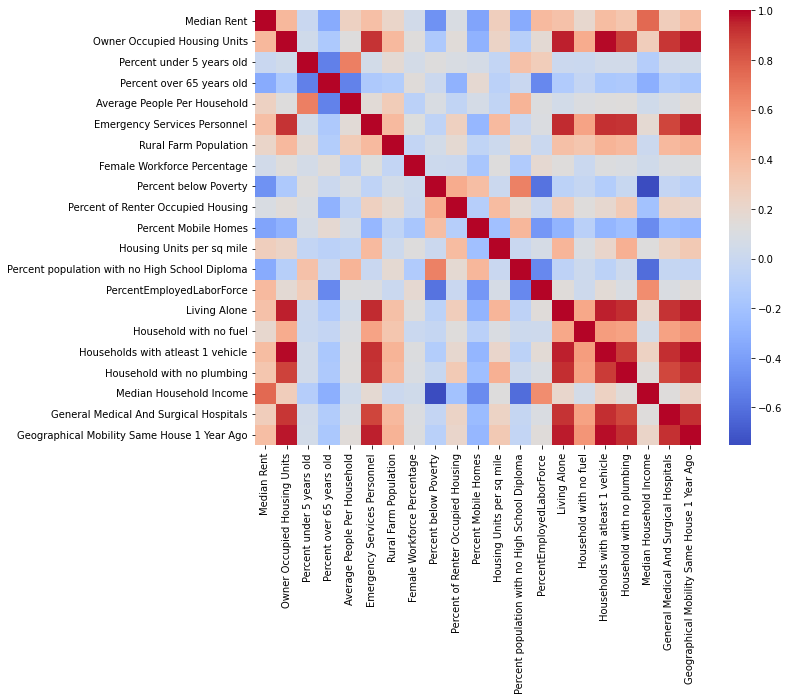

In [171]:
corr_matrix = data.corr()
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr_matrix, cmap="coolwarm", ax=ax)
plt.show()

In general, it is desirable to avoid using highly correlated independent variables as inputs to a machine learning model. This is because highly correlated variables can lead to overfitting, where the model fits the noise in the data instead of the underlying relationships between the independent and dependent variables. 

A commonly used rule of thumb is to avoid using variables with a correlation coefficient above 0.7 or below -0.7. However, the exact threshold for acceptable correlation depends on the specific problem and the nature of the data. It is generally a good idea to examine the pairwise correlation between the independent variables and remove highly correlated variables before fitting a machine learning model.

In [172]:
print("Enter method for dropping columns: ")
option_a = widgets.Checkbox(description='Remove by selecting names')
option_b = widgets.Checkbox(description='Remove by correlation index')
display(option_a)
display(option_b)

Enter method for dropping columns: 


Checkbox(value=False, description='Remove by selecting names')

Checkbox(value=False, description='Remove by correlation index')

In [173]:
if option_a.value:
        checkboxes = []
        for col in data.columns:
            checkbox = widgets.Checkbox(description=col)
            checkboxes.append(checkbox)

        checkboxes_widget = widgets.VBox(checkboxes)
        display(checkboxes_widget)

        button = widgets.Button(description="Drop Selected Columns")
        display(button)

        def drop_columns(button):
            columns_to_drop = []
            for i in range(len(checkboxes)):
                if checkboxes[i].value:
                    columns_to_drop.append(data.columns[i])

            data.drop(columns_to_drop, axis=1, inplace=True)
            print("Columns dropped:", columns_to_drop)
            print("Updated dataframe:")
            display(data)

        button.on_click(drop_columns)

In [174]:
if option_b.value:
        to_remove = set()
        threshold = input("Enter the correlation index (0.7 is usual):")
        print("Columns being removed because of high correlation:\n")
        for i in range(len(corr_matrix.columns)):
            for j in range(i):
                if abs(corr_matrix.iloc[i, j]) >= float(threshold):
                    colname = corr_matrix.columns[i]
                    to_remove.add(colname)
                    
        for colname in to_remove:
            print(colname)
        data = data.drop(to_remove, axis=1)

Enter the correlation index (0.7 is usual): 0.9


Columns being removed because of high correlation:

General Medical And Surgical Hospitals
Emergency Services Personnel
Geographical Mobility Same House 1 Year Ago
Households with atleast 1 vehicle
Household with no plumbing
Living Alone


In [187]:
#Dependent variables
X = data
#Independent variables for classifiers
y_class = final_df['index']
ya_class = final_df['adaptiernum']
yv_class = final_df['vultiernum']
#Independent variables for regressors
ya_value = final_df['Adaptability']
yv_value = final_df['Vulnerability']

### Feature Scaling

<p> Why? - To have an unbiased evaluation. Otherwise Eucledian distance mire the results. If the features are on different scales, the larger ones can have a disproportionately large effect on the model, leading to biased results. By scaling the features to have zero mean and unit variance (using techniques such as StandardScaler or MinMaxScaler), we can ensure that all features have a similar impact on the model. </p>

In [188]:
sc = StandardScaler()
X = sc.fit_transform(X)

### Test-train split

It divides the entire dataset into a user-inputted split. The training set is used to perform training and hyperparameter tuning, and the testing set to compare the tuned models’ performances.

In [189]:
test_split = widgets.FloatSlider(min=0.1, max=0.9, step=0.1, value=0.3, description='Test Split')
random_state = widgets.IntText(value=42, description='Random State')

def on_submit_button_clicked(b):
    print('Test Split:', test_split.value)
    print('Random State:', random_state.value)
    
submit_button = widgets.Button(description='Submit')
submit_button.on_click(on_submit_button_clicked)

display(test_split)
display(random_state)
display(submit_button)

FloatSlider(value=0.3, description='Test Split', max=0.9, min=0.1)

IntText(value=42, description='Random State')

Button(description='Submit', style=ButtonStyle())

In [190]:
#For CI
X_train, X_test, y_train, y_test = train_test_split(X, y_class, test_size=test_split.value, random_state=random_state.value)
#For Classifiers
Xvc_train, Xvc_test, yvc_train, yvc_test = train_test_split(X, yv_class, test_size=test_split.value, random_state=random_state.value)
Xac_train, Xac_test, yac_train, yac_test = train_test_split(X, ya_class, test_size=test_split.value, random_state=random_state.value)
#For Regressors
Xvr_train, Xvr_test, yvr_train, yvr_test = train_test_split(X, yv_value, test_size=test_split.value, random_state=random_state.value)
Xar_train, Xar_test, yar_train, yar_test = train_test_split(X, ya_value, test_size=test_split.value, random_state=random_state.value)

# Regressors

In [198]:
warnings.filterwarnings("ignore")

## Linear Regresson

Linear regression is a statistical method used to study the relationship between two continuous variables by fitting a linear equation to the observed data. The goal of linear regression is to find the best-fit line that can predict the value of the dependent variable (Y) based on the value of the independent variable (X).

Pros:
- Simple and easy to understand.
- Fast and computationally efficient.
- Works well when the relationship between variables is linear.

Cons:
- Assumes a linear relationship between variables, which may not always hold true.
- Sensitive to outliers, as they can significantly impact the fit of the model.
- Cannot handle non-linear relationships or interactions between variables.

### Adaptability

MSE: 1.56
RMSE: 1.25
MAE: 0.86
R^2: -0.02


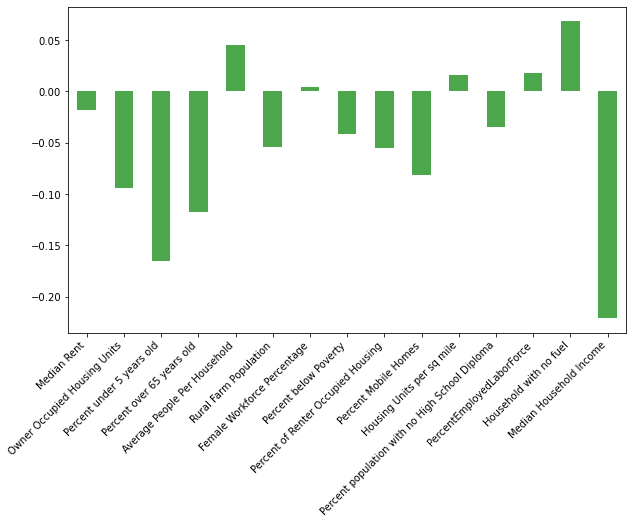

In [199]:
lin_reg = LinearRegression()

params = {'normalize': [True, False]}
grid_search = GridSearchCV(lin_reg, params, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(Xar_train, yar_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

importances = best_model.coef_

feature_importance_df = pd.DataFrame(importances, index=data.columns, columns=['importance'])
ax = feature_importance_df.plot(kind='bar', legend=False, figsize=(10, 6), color='green', alpha=0.7)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

y_pred = best_model.predict(Xar_test)
mse = mean_squared_error(yar_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(yar_test, y_pred)
r2 = r2_score(yar_test, y_pred)

print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'MAE: {mae:.2f}')
print(f'R^2: {r2:.2f}')

### Vulnerability

MSE: 0.92
RMSE: 0.96
MAE: 0.59
R^2: -0.06


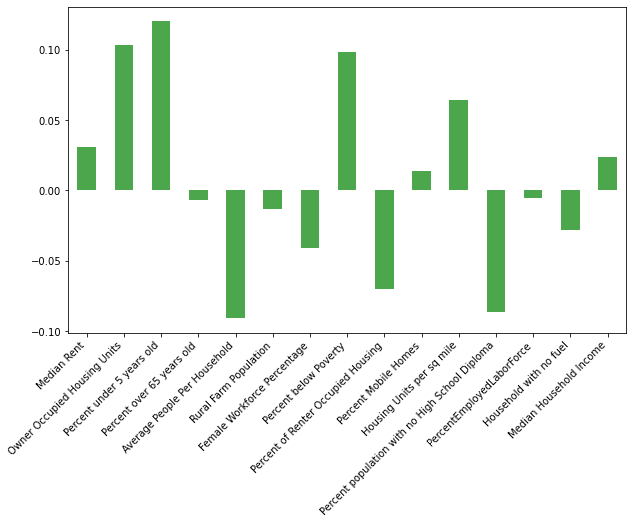

In [200]:
lin_reg = LinearRegression()

params = {'normalize': [True, False]}
grid_search = GridSearchCV(lin_reg, params, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(Xvr_train, yvr_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

importances = best_model.coef_

feature_importance_df = pd.DataFrame(importances, index=data.columns, columns=['importance'])
ax = feature_importance_df.plot(kind='bar', legend=False, figsize=(10, 6), color='green', alpha=0.7)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

y_pred = best_model.predict(Xvr_test)
mse = mean_squared_error(yvr_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(yvr_test, y_pred)
r2 = r2_score(yvr_test, y_pred)

print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'MAE: {mae:.2f}')
print(f'R^2: {r2:.2f}')

## Ridge Regresson

Ridge regression is a linear regression algorithm used to deal with multicollinearity in data. It adds a penalty term to the sum of squared errors that forces the model to choose smaller coefficients for correlated variables. This helps to reduce the variance in the model by shrinking the regression coefficients towards zero.

Pros of Ridge Regression:
- Helps to deal with multicollinearity in the data
- Can improve the stability and generalization performance of the model
- Can prevent overfitting of the model by reducing the variance in the estimates
- Works well when the number of predictors is larger than the number of samples

Cons of Ridge Regression:
- The selection of the penalty parameter is crucial for the performance of the model
- It assumes that all predictors are relevant to the outcome, which may not always be the case
- It does not perform feature selection, meaning all variables will be retained in the model, which can lead to overfitting

### Adaptability

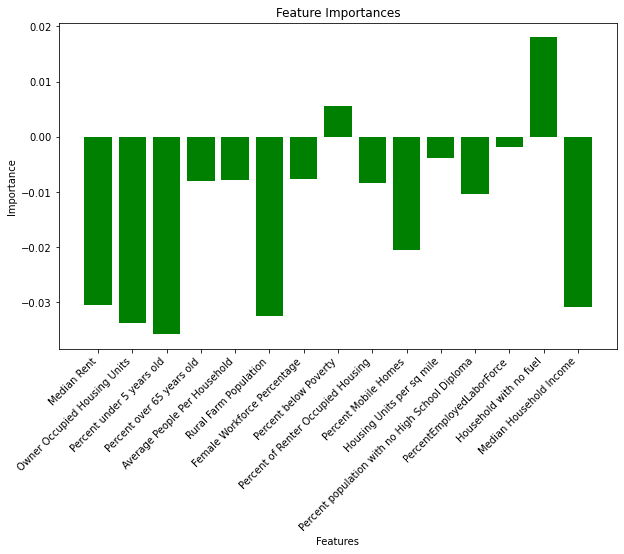

MSE: 1.54
RMSE: 1.24
MAE: 0.85
R^2: -0.01


In [201]:
param_grid = {'alpha': np.logspace(-3, 3, 7)}

ridge = Ridge()
grid_search = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error')

grid_search.fit(Xar_train, yar_train)

best_model = grid_search.best_estimator_

importances = best_model.coef_
labels = data.columns

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(labels, importances, color='green')
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_title('Feature Importances')
ax.set_xlabel('Features')
ax.set_ylabel('Importance')
plt.show()

y_pred = best_model.predict(Xar_test)

mse = mean_squared_error(yar_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(yar_test, y_pred)
r2 = r2_score(yar_test, y_pred)

print('MSE: {:.2f}'.format(mse))
print('RMSE: {:.2f}'.format(rmse))
print('MAE: {:.2f}'.format(mae))
print('R^2: {:.2f}'.format(r2))

### Vulnerability

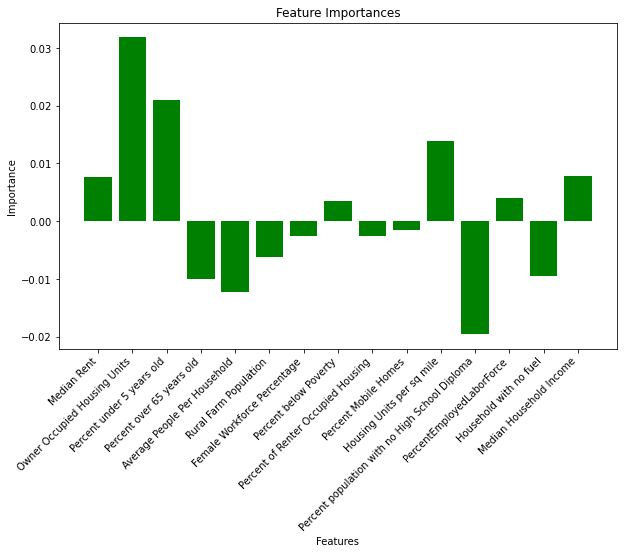

MSE: 0.88
RMSE: 0.94
MAE: 0.58
R^2: -0.01


In [202]:
param_grid = {'alpha': np.logspace(-3, 3, 7)}

ridge = Ridge()
grid_search = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error')

grid_search.fit(Xvr_train, yvr_train)

best_model = grid_search.best_estimator_

importances = best_model.coef_
labels = data.columns

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(labels, importances, color='green')
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_title('Feature Importances')
ax.set_xlabel('Features')
ax.set_ylabel('Importance')
plt.show()

y_pred = best_model.predict(Xvr_test)

mse = mean_squared_error(yvr_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(yvr_test, y_pred)
r2 = r2_score(yvr_test, y_pred)

print('MSE: {:.2f}'.format(mse))
print('RMSE: {:.2f}'.format(rmse))
print('MAE: {:.2f}'.format(mae))
print('R^2: {:.2f}'.format(r2))

## Lasso Regresson

Lasso regression is a type of linear regression that adds a regularization term to the cost function, which helps in reducing the complexity of the model by shrinking the coefficients of the less important features to zero. 

Pros:
- It can handle high dimensional datasets with many features and avoid overfitting.
- It helps in identifying the most important features by shrinking the coefficients of the less important features to zero.
- It can be useful for feature selection.

Cons:
- Lasso regression can only be applied to linear models.
- It can be unstable when dealing with highly correlated features.
- It does not work well when the number of features is larger than the number of observations in the dataset.

### Adaptability

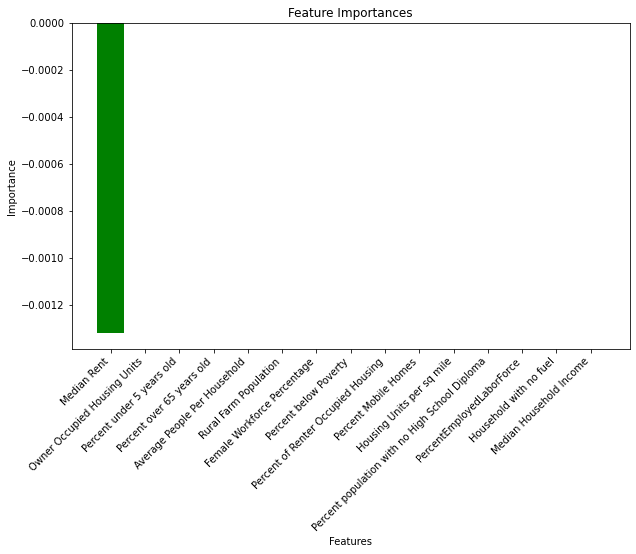

MSE:  1.5277404264419825
RMSE:  1.2360179717309867
MAE:  0.8498134317807826
R^2:  -0.0010750728459756331


In [203]:
params = {"alpha": [0.1, 1, 10]}
lasso = Lasso()
grid = GridSearchCV(lasso, params, cv=5)
grid.fit(Xar_train, yar_train)

best_estimator = grid.best_estimator_

importances = best_estimator.coef_
labels = data.columns

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(labels, importances, color='green')
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_title('Feature Importances')
ax.set_xlabel('Features')
ax.set_ylabel('Importance')
plt.show()

y_pred = best_estimator.predict(Xar_test)

mse = mean_squared_error(yar_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(yar_test, y_pred)
r2 = r2_score(yar_test, y_pred)

print("MSE: ", mse)
print("RMSE: ", rmse)
print("MAE: ", mae)
print("R^2: ", r2)

### Vulnerability

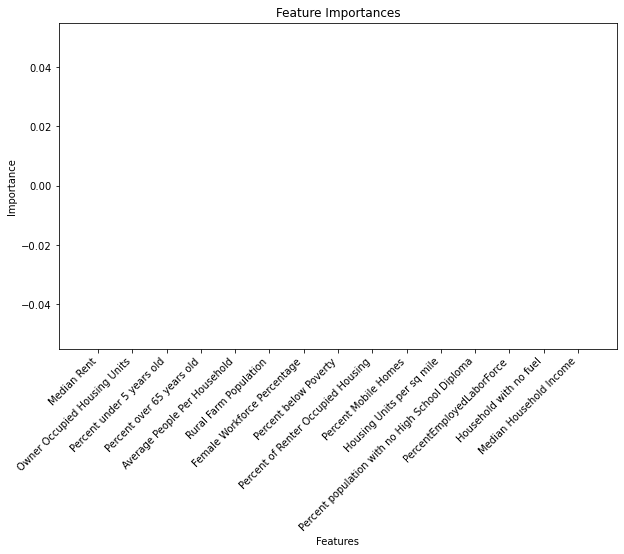

MSE:  0.866772804977778
RMSE:  0.9310063399235141
MAE:  0.5702902197478893
R^2:  -1.4780565848138139e-05


In [204]:
params = {"alpha": [0.1, 1, 10]}
lasso = Lasso()
grid = GridSearchCV(lasso, params, cv=5)
grid.fit(Xvr_train, yvr_train)

best_estimator = grid.best_estimator_

importances = best_estimator.coef_
labels = data.columns

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(labels, importances, color='green')
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.set_title('Feature Importances')
ax.set_xlabel('Features')
ax.set_ylabel('Importance')
plt.show()

y_pred = best_estimator.predict(Xvr_test)

mse = mean_squared_error(yvr_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(yvr_test, y_pred)
r2 = r2_score(yvr_test, y_pred)

print("MSE: ", mse)
print("RMSE: ", rmse)
print("MAE: ", mae)
print("R^2: ", r2)

## Support Vector Regression 

Lasso regression is a type of linear regression that adds a regularization term to the cost function, which helps in reducing the complexity of the model by shrinking the coefficients of the less important features to zero. 

Pros:
- It can handle high dimensional datasets with many features and avoid overfitting.
- It helps in identifying the most important features by shrinking the coefficients of the less important features to zero.
- It can be useful for feature selection.

Cons:
- Lasso regression can only be applied to linear models.
- It can be unstable when dealing with highly correlated features.
- It does not work well when the number of features is larger than the number of observations in the dataset.

### Adaptability

In [ ]:
svr = SVR()

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'gamma': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

grid_search = GridSearchCV(svr, param_grid, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
grid_search.fit(Xar_train, yar_train.values.ravel())

print("Best parameters:", grid_search.best_params_)
print("Best score:", -grid_search.best_score_)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(Xar_test)

mse = mean_squared_error(yar_test, y_pred)
rmse = mean_squared_error(yar_test, y_pred, squared=False)
mae = mean_absolute_error(yar_test, y_pred)
r2 = r2_score(yar_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R^2:", r2)

results = permutation_importance(best_model, Xar_test, yar_test, n_repeats=10, random_state=random_state.value)
importances = results.importances_mean
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(data.columns, importances, color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

### Vulnerability

In [ ]:
svr = SVR()

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'gamma': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

grid_search = GridSearchCV(svr, param_grid, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
grid_search.fit(Xvr_train, yvr_train.values.ravel())

print("Best parameters:", grid_search.best_params_)
print("Best score:", -grid_search.best_score_)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(Xvr_test)

mse = mean_squared_error(yvr_test, y_pred)
rmse = mean_squared_error(yvr_test, y_pred, squared=False)
mae = mean_absolute_error(yvr_test, y_pred)
r2 = r2_score(yvr_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R^2:", r2)

results = permutation_importance(best_model, Xvr_test, yvr_test, n_repeats=10, random_state=random_state.value)
importances = results.importances_mean
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(data.columns, importances, color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

## Random Forest Regression

Random Forest Regression builds a number of decision trees on a randomly selected subset of the training set, and then averages the predictions of each tree to produce the final prediction. The randomness in the selection of features and samples reduces the variance and overfitting.

Pros:
- Handles high dimensional datasets well
- Can handle both categorical and continuous data
- Tends to have good predictive accuracy
- Provides a measure of feature importance

Cons:
- Can be slower than other regression algorithms due to the large number of trees
- Can be difficult to interpret the relationships between the independent and dependent variables
- May overfit the training data if the number of trees is too large

### Adaptability

In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'max_depth': [5, 10, 15, 20, 25, 30],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

rf = RandomForestRegressor(random_state=random_state.value)

rf_random = RandomizedSearchCV(estimator=rf, param_distributions=param_grid,
                               n_iter=100, cv=5, verbose=0, random_state=random_state.value, n_jobs=-1)

rf_random.fit(Xar_train, yar_train.values.ravel())
y_pred = rf_random.predict(Xar_test)

print('MSE:', mean_squared_error(yar_test, y_pred))
print('RMSE:', np.sqrt(mean_squared_error(yar_test, y_pred)))
print('MAE:', mean_absolute_error(yar_test, y_pred))
print('R^2:', r2_score(yar_test, y_pred))

feature_importances = pd.DataFrame(rf_random.best_estimator_.feature_importances_,
                                   index = data.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances.index, feature_importances.importance, color='green')
plt.gca().invert_yaxis()
plt.title('Feature Importances', fontsize=16)
plt.xlabel('Importance', ha='right')
plt.xticks(rotation=45, ha='right')
plt.show()

### Vulnerability

In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'max_depth': [5, 10, 15, 20, 25, 30],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

rf = RandomForestRegressor(random_state=random_state.value)

rf_random = RandomizedSearchCV(estimator=rf, param_distributions=param_grid,
                               n_iter=100, cv=5, verbose=0, random_state=random_state.value, n_jobs=-1)

rf_random.fit(Xvr_train, yvr_train.values.ravel())
y_pred = rf_random.predict(Xvr_test)

print('MSE:', mean_squared_error(yvr_test, y_pred))
print('RMSE:', np.sqrt(mean_squared_error(yvr_test, y_pred)))
print('MAE:', mean_absolute_error(yvr_test, y_pred))
print('R^2:', r2_score(yvr_test, y_pred))

feature_importances = pd.DataFrame(rf_random.best_estimator_.feature_importances_,
                                   index = data.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances.index, feature_importances.importance, color='green')
plt.gca().invert_yaxis()
plt.title('Feature Importances', fontsize=16)
plt.xlabel('Importance', ha='right')
plt.xticks(rotation=45, ha='right')
plt.show()

## XGBoost Regression

XGBoost Regression is a type of regression algorithm that uses an ensemble of decision trees to make predictions. It is an extension of the gradient boosting algorithm, and is known for its high predictive power and speed.

Pros:
- High accuracy: XGBoost Regression is known for its high accuracy and predictive power, making it a popular choice for regression tasks.
- Speed: XGBoost Regression is optimized for performance, and can handle large datasets with ease.
- Handles missing data: XGBoost Regression can handle missing data by using regularization techniques.
- Feature importance: XGBoost Regression provides a feature importance score, which can help identify the most important variables in the dataset.

Cons:
- Overfitting: XGBoost Regression can be prone to overfitting if the hyperparameters are not tuned correctly.
- Complexity: XGBoost Regression can be more complex to implement and tune than simpler regression algorithms.
- Black box: Like other ensemble methods, XGBoost Regression can be difficult to interpret due to its black box nature.

### Adaptability

Best Hyperparameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}
Best Score:  -0.0483558188559269
MSE:  4.8994140739483525
RMSE:  2.2134620109566714
MAE:  0.9881960925264685
R^2:  -0.025295989245864847


AttributeError: 'Rectangle' object has no property 'ha'

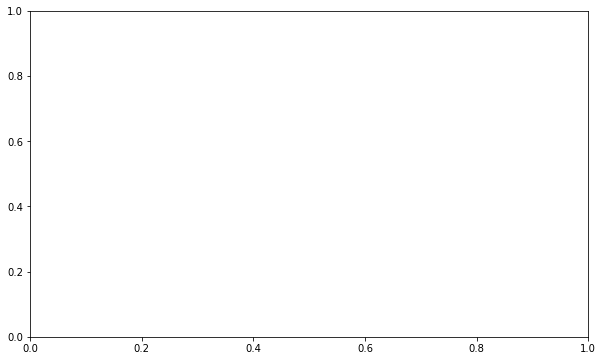

In [175]:
xgb = XGBRegressor(objective='reg:squarederror')

param_grid = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 1],
    'max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(Xar_train, yar_train)

print('Best Hyperparameters: ', grid_search.best_params_)
print('Best Score: ', grid_search.best_score_)

xgb_best = XGBRegressor(objective='reg:squarederror', **grid_search.best_params_)

xgb_best.fit(Xar_train, yar_train)

y_pred = xgb_best.predict(Xar_test)

# calculate performance metrics
mse = mean_squared_error(yar_test, y_pred)
rmse = mean_squared_error(yar_test, y_pred, squared=False)
mae = mean_absolute_error(yar_test, y_pred)
r2 = r2_score(yar_test, y_pred)

print('MSE: ', mse)
print('RMSE: ', rmse)
print('MAE: ', mae)
print('R^2: ', r2)

# plot feature importance in a column chart
fig, ax = plt.subplots(figsize=(10, 6))
importances = pd.Series(xgb_best.feature_importances_, index=data.columns)
importances.plot(kind='barh', ax=ax, color='green', ha='right')
plt.xticks(rotation=45)
plt.show()

### Vulnerability

In [ ]:
xgb = XGBRegressor(objective='reg:squarederror')

param_grid = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 1],
    'max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(Xvr_train, yvr_train)

print('Best Hyperparameters: ', grid_search.best_params_)
print('Best Score: ', grid_search.best_score_)

xgb_best = XGBRegressor(objective='reg:squarederror', **grid_search.best_params_)

xgb_best.fit(Xvr_train, yvr_train)

y_pred = xgb_best.predict(Xvr_test)

# calculate performance metrics
mse = mean_squared_error(yvr_test, y_pred)
rmse = mean_squared_error(yvr_test, y_pred, squared=False)
mae = mean_absolute_error(yvr_test, y_pred)
r2 = r2_score(yvr_test, y_pred)

print('MSE: ', mse)
print('RMSE: ', rmse)
print('MAE: ', mae)
print('R^2: ', r2)

# plot feature importance in a column chart
fig, ax = plt.subplots(figsize=(10, 6))
importances = pd.Series(xgb_best.feature_importances_, index=data.columns)
importances.plot(kind='barh', ax=ax, color='green', ha='right')
plt.xticks(rotation=45)
plt.show()

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=300; total time=   2.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=300; total time=   2.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   2.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=300; total time=   2.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=200; total time=   4.4s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=200; total time=   3.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=20, n_estimators=200; total time=   3.9s
[CV] END max_depth=15, max_feature

# Classifiers

In [114]:
fi = pd.DataFrame(columns=variables.columns)
fi.rename(columns = {'FIPScounty':'Classifier'}, inplace = True)
fi.loc[0,'Classifier']=''
fi.loc[1,'Classifier']='Gaussian Naive Bayes'
fi.loc[2,'Classifier']='Linear Discriminant Analysis'
fi.loc[3,'Classifier']='Logistic Regression'
fi.loc[4,'Classifier']='Support Vector Machines'
fi.loc[5,'Classifier']='Random Forest'

In [116]:
fa=fi.copy()
fv=fi.copy()

In [117]:
fi.head()

,Classifier,MEDRENT,MVALOO,PCTKID,PCTOLD,AVGPERHH,PCTFRMPOP,FEMLBR,PCTFHH,PCTPOV,...,LGINREV,GENEXPPC,EXPED,INFMTR,CHILLD,DISNWR,LBWB,HUWNF,HUWNP,MD
0,,Median Rent,Median value of owner-occupied housing,Percent under 5 years old,Percent over 65 years old,Average number of people per household,Percent rural farm population,Percent of the workforce that is female,Percent female-headed households,Percent of the population living below poverty,...,"Local government finance, revenue per capita",Local government finance general expenditures ...,Local government finance expenditures for educ...,"5-year average infant mortality per 10,000 births","3-year average chronic illness deaths per 10,0...","Disabled and nonworking labor forces per 10,00...","3-year total low-birth-weight babies per 10,00...","Households with no fuel used per 10,000 house ...","Households with no plumbing per 10,000 house u...","Non-federal active medical doctors per 10,000 ..."
1,Gaussian Naive Bayes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Linear Discriminant Analysis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Logistic Regression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Support Vector Machines,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Gaussian Fit Algorithm

<ul>
    <li>Naive Bayes (NB) is a <b>supervised machine learning algorithm</b>.</li>
    <li><b>Purpose:</b> Predict the classification of a query sample by relying on labeled input data which are separated into classes.</li>
    <li><b>Assumption:</b> Features are independent of each other (Naive).</li>
    <li>No curse of dimensionality</li>
    <li>Less prone to overfitting</li>
    <li>Can handle multicollinearity</li>
    <li>Sensitive to outliers and imbalanced data</li>
</ul>

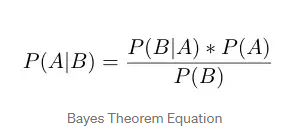

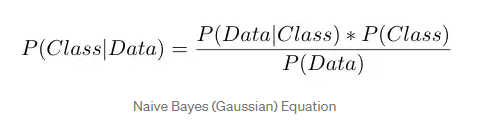

### Resilience Score

In [82]:
param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

gnb = GaussianNB()
gnb_cv = GridSearchCV(gnb, param_grid, cv=5, n_jobs=-1)
gnb_cv.fit(X_train, y_train)

print("Best Hyperparameters: ",gnb_cv.best_params_)
print("Best Model: ",gnb_cv.best_estimator_)

gnb = gnb_cv.best_estimator_
gnb.fit(X_train, y_train)

# Getting feature importances
# Please complete

y_pred = gnb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

Best Hyperparameters:  {'var_smoothing': 0.0657933224657568}
Best Model:  GaussianNB(var_smoothing=0.0657933224657568)
Accuracy on Test Data: 4.94%


### Vulnerability Index

In [92]:
# Defining the parameter grid to be searched over
param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

# Performing Grid Search Cross Validation
gnb = GaussianNB()
gnb_cv = GridSearchCV(gnb, param_grid, cv=5, n_jobs=-1)
gnb_cv.fit(Xvc_train, yvc_train)

# Printing the best hyperparameters
print("Best Hyperparameters: ",gnb_cv.best_params_)
print("Best Model: ",gnb_cv.best_estimator_)

# Fitting the model on the whole dataset with best hyperparameters
gnb = gnb_cv.best_estimator_
gnb.fit(Xvc_train, yvc_train)

# Getting feature importances
#Please complete

# Predicting on test data and calculating accuracy
y_pred = gnb.predict(Xvc_test)
accuracy = accuracy_score(yvc_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

Best Hyperparameters:  {'var_smoothing': 1.0}
Best Model:  GaussianNB(var_smoothing=1.0)
Accuracy on Test Data: 29.22%


### Adaptability Index

In [93]:
# Defining the parameter grid to be searched over
param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

# Performing Grid Search Cross Validation
gnb = GaussianNB()
gnb_cv = GridSearchCV(gnb, param_grid, cv=5, n_jobs=-1)
gnb_cv.fit(Xac_train, yac_train)

# Printing the best hyperparameters
print("Best Hyperparameters: ",gnb_cv.best_params_)
print("Best Model: ",gnb_cv.best_estimator_)

# Fitting the model on the whole dataset with best hyperparameters
gnb = gnb_cv.best_estimator_
gnb.fit(Xac_train, yac_train)

# Getting feature importances
# Please complete

# Predicting on test data and calculating accuracy
y_pred = gnb.predict(Xac_test)
accuracy = accuracy_score(yac_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

Best Hyperparameters:  {'var_smoothing': 0.15199110829529336}
Best Model:  GaussianNB(var_smoothing=0.15199110829529336)
Accuracy on Test Data: 27.57%


## Linear Discriminant Analysis Algorithm

Linear Discriminant Analysis (LDA) Classifier is a linear classification algorithm that models the distribution of the independent variables in each class and uses this information to find the decision boundary that maximizes the separation between the classes. 

Pros:
- LDA is a fast and simple algorithm that works well when the number of features is small compared to the number of samples.
- LDA is less prone to overfitting than other linear classifiers.
- LDA can be used for both binary and multiclass classification.

Cons:
- LDA assumes that the distribution of the independent variables in each class is Gaussian, which may not be the case in practice.
- LDA assumes that the variance of the independent variables is the same for all classes, which may not be the case in practice.
- LDA does not perform well when the classes are not well-separated or when there is a large overlap between the classes.

### Resilience Score

Accuracy on Test Data: 8.23%


Feature: Score
Median Rent: 0.21151
Percent under 5 years old: -0.23528
Percent over 65 years old: 0.05951
Percent rural farm population: 0.08388
Percent of the workforce that is female: -0.04047
Percent family households: 0.23661
Percent of the population living below poverty: 0.00129
Percent of the population that rents: -0.01055
Percent of homes that are mobile homes: 0.06907
Number of houses per square mile: -0.05527
Percent of the workforce that is employed: 0.06975
Percent of the population that voted in 2000 presidential election: 0.13415
Local government finance, revenue per capita: -0.20420
Local government finance expenditures for education: -0.13040
5-year average infant mortality per 10,000 births: 0.02805
3-year total low-birth-weight babies per 10,000 live births: -0.08234
Households with no fuel used per 10,000 house units: -0.08473
Households with no plumbing per 10,000 house units: 0.09214


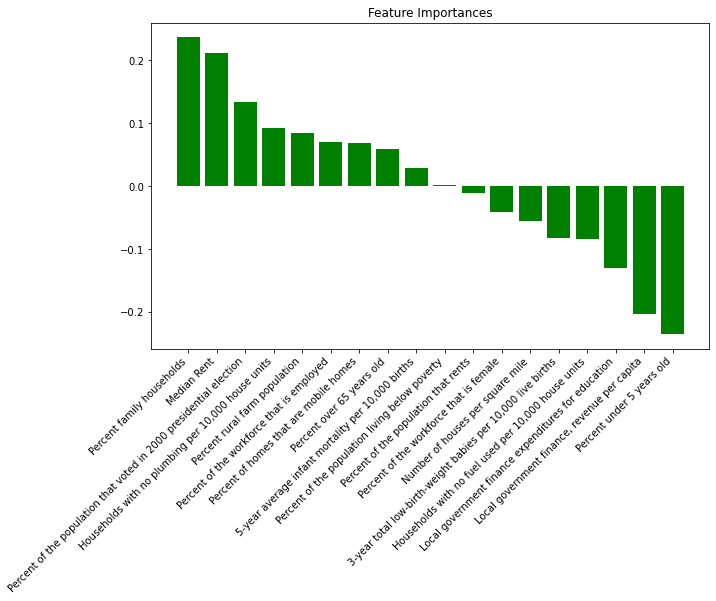

In [106]:
lda = LinearDiscriminantAnalysis()
params = {'solver': ['svd', 'lsqr', 'eigen']}
lda_grid = GridSearchCV(lda, params)
lda_grid.fit(X_train, y_train)

y_pred = lda_grid.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))
print("\n")

importances = lda_grid.best_estimator_.coef_[0]
feature_names = data.columns
importances_dict = dict(zip(feature_names, importances))
importances_sorted = sorted(importances_dict.items(), key=lambda x: x[1], reverse=True)
importances_mean = [x[1] for x in importances_sorted]
feature_names_sorted = [x[0] for x in importances_sorted]

print('Feature: Score')
for i,v in enumerate(importances):
    print('%s: %.5f' % (data.columns[i],v))

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(feature_names_sorted, importances_mean, color='green')
ax.set_title("Feature Importances")
x_ticks = list(range(len(data.columns)))
ax.set_xticks(x_ticks)
ax.set_xticklabels(feature_names_sorted, rotation=45, ha='right')
plt.show()

### Adaptability Index

Accuracy on Test Data: 25.51%


Feature: Score
Median Rent: 0.15046
Percent under 5 years old: 0.01633
Percent over 65 years old: 0.11158
Percent rural farm population: 0.11612
Percent of the workforce that is female: -0.07178
Percent family households: 0.16733
Percent of the population living below poverty: 0.07331
Percent of the population that rents: 0.02002
Percent of homes that are mobile homes: -0.08010
Number of houses per square mile: -0.08536
Percent of the workforce that is employed: 0.00248
Percent of the population that voted in 2000 presidential election: 0.13648
Local government finance, revenue per capita: -0.17469
Local government finance expenditures for education: -0.07171
5-year average infant mortality per 10,000 births: 0.01964
3-year total low-birth-weight babies per 10,000 live births: -0.10036
Households with no fuel used per 10,000 house units: -0.04401
Households with no plumbing per 10,000 house units: 0.10676


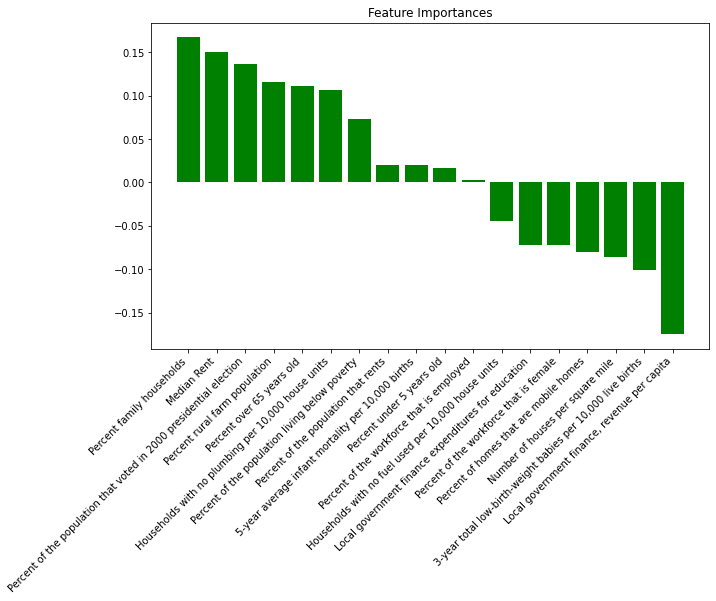

In [102]:
lda = LinearDiscriminantAnalysis()
params = {'solver': ['svd', 'lsqr', 'eigen']}
lda_grid = GridSearchCV(lda, params)
lda_grid.fit(Xac_train, yac_train)

y_pred = lda_grid.predict(Xac_test)
accuracy = accuracy_score(yac_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))
print("\n")

importances = lda_grid.best_estimator_.coef_[0]
feature_names = data.columns
importances_dict = dict(zip(feature_names, importances))
importances_sorted = sorted(importances_dict.items(), key=lambda x: x[1], reverse=True)
importances_mean = [x[1] for x in importances_sorted]
feature_names_sorted = [x[0] for x in importances_sorted]

print('Feature: Score')
for i,v in enumerate(importances):
    print('%s: %.5f' % (data.columns[i],v))

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(feature_names_sorted, importances_mean, color='green')
ax.set_title("Feature Importances")
x_ticks = list(range(len(data.columns)))
ax.set_xticks(x_ticks)
ax.set_xticklabels(feature_names_sorted, rotation=45, ha='right')
plt.show()

### Vulnerability Index

Accuracy on Test Data: 26.75%


Feature: Score
Median Rent: 0.07830
Percent under 5 years old: 0.10724
Percent over 65 years old: 0.08337
Percent rural farm population: 0.11262
Percent of the workforce that is female: 0.13338
Percent family households: -0.01711
Percent of the population living below poverty: 0.24038
Percent of the population that rents: -0.06423
Percent of homes that are mobile homes: -0.10843
Number of houses per square mile: -0.01494
Percent of the workforce that is employed: -0.13251
Percent of the population that voted in 2000 presidential election: 0.13067
Local government finance, revenue per capita: 0.07664
Local government finance expenditures for education: 0.00457
5-year average infant mortality per 10,000 births: -0.12001
3-year total low-birth-weight babies per 10,000 live births: -0.02576
Households with no fuel used per 10,000 house units: -0.06813
Households with no plumbing per 10,000 house units: -0.07460


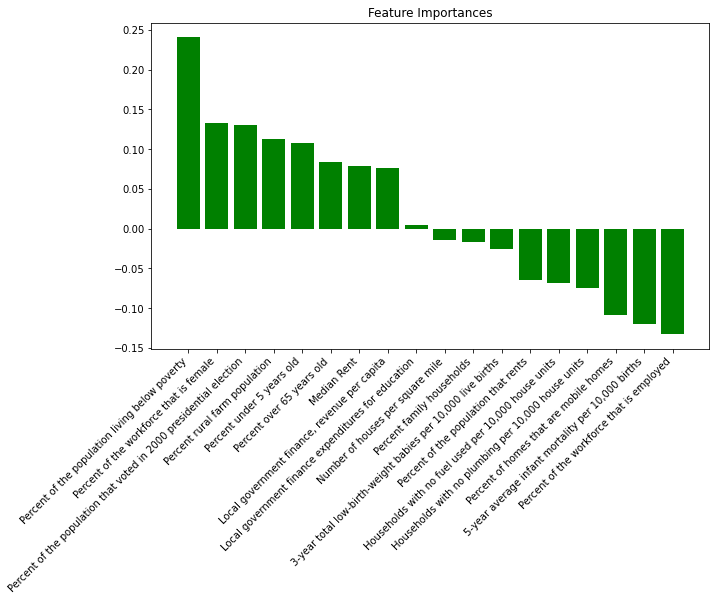

In [107]:
lda = LinearDiscriminantAnalysis()
params = {'solver': ['svd', 'lsqr', 'eigen']}
lda_grid = GridSearchCV(lda, params)
lda_grid.fit(Xvc_train, yvc_train)

y_pred = lda_grid.predict(Xvc_test)
accuracy = accuracy_score(yvc_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))
print("\n")

importances = lda_grid.best_estimator_.coef_[0]
feature_names = data.columns
importances_dict = dict(zip(feature_names, importances))
importances_sorted = sorted(importances_dict.items(), key=lambda x: x[1], reverse=True)
importances_mean = [x[1] for x in importances_sorted]
feature_names_sorted = [x[0] for x in importances_sorted]

print('Feature: Score')
for i,v in enumerate(importances):
    print('%s: %.5f' % (data.columns[i],v))

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(feature_names_sorted, importances_mean, color='green')
ax.set_title("Feature Importances")
x_ticks = list(range(len(data.columns)))
ax.set_xticks(x_ticks)
ax.set_xticklabels(feature_names_sorted, rotation=45, ha='right')
plt.show()

## Logistic Regression

Logistic Regression is a statistical algorithm used for binary classification tasks. It models the relationship between a dependent binary variable and a set of independent variables by estimating probabilities using a logistic function. The output of a logistic regression model is the probability of the occurrence of the binary outcome. 

Pros:
- Logistic Regression is simple and easy to implement
- It is computationally efficient and works well on large datasets
- It can handle non-linear effects and interactions between variables with appropriate feature engineering
- Provides interpretable results in terms of feature importance

Cons:
- Logistic Regression is not suitable for solving multiclass classification problems
- It assumes a linear relationship between the independent variables and the dependent variable, which may not always be true
- It may be affected by the presence of outliers and multicollinearity in the data
- It may require careful feature engineering and regularization to avoid overfitting.

In [109]:
import warnings
warnings.filterwarnings('ignore')

### Resilience Score

Best hyperparameters:  {'C': 0.0018329807108324356, 'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy on test data:  0.09876543209876543


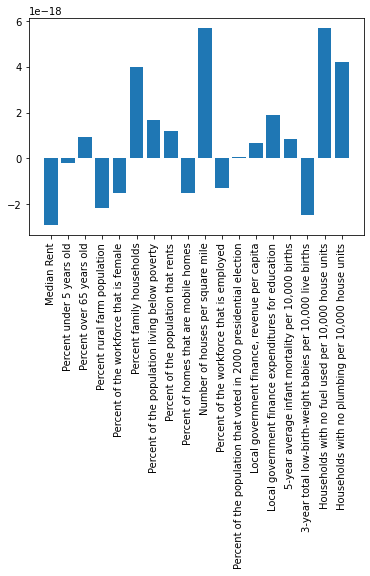

In [110]:
log_reg = LogisticRegression()
hyperparameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 500, 1000, 5000]
}

# Using GridSearchCV to find the best hyperparameters for the model
grid_search = GridSearchCV(log_reg, hyperparameters, cv=5)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

# best hyperparameters to fit the model
log_reg = LogisticRegression(**grid_search.best_params_)
log_reg.fit(X_train, y_train)

# accuracy on test data
y_pred = log_reg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

# Get feature importances
importances = log_reg.coef_
importances_mean = np.mean(importances, axis=0)

# feature importances chart
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(data.columns, importances_mean, color='green')
ax.set_title("Feature Importances")
x_ticks = list(range(len(data.columns)))
ax.set_xticks(x_ticks)
ax.set_xticklabels(data.columns, rotation=45, ha='right')
plt.show()

### Vulnerability Index

Best hyperparameters:  {'C': 0.0001, 'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy on Test Data: 19.34%


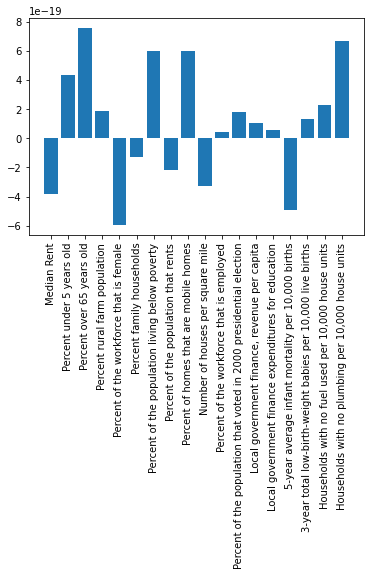

In [112]:
log_reg = LogisticRegression()
hyperparameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 500, 1000, 5000]
}

grid_search = GridSearchCV(log_reg, hyperparameters, cv=5)
grid_search.fit(Xvc_train, yvc_train)

print("Best hyperparameters: ", grid_search.best_params_)
log_reg = LogisticRegression(**grid_search.best_params_)
log_reg.fit(Xvc_train, yvc_train)

# Print the accuracy on test data
y_pred = log_reg.predict(Xvc_test)
accuracy = accuracy_score(yvc_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

# Get feature importances
importances = log_reg.coef_
importances_mean = np.mean(importances, axis=0)

# Print the feature importances in a column chart
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(data.columns, importances_mean, color='green')
ax.set_title("Feature Importances")
x_ticks = list(range(len(data.columns)))
ax.set_xticks(x_ticks)
ax.set_xticklabels(data.columns, rotation=45, ha='right')
plt.show()

### Adaptability Index

Best hyperparameters:  {'C': 0.615848211066026, 'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy on test data:  0.2551440329218107


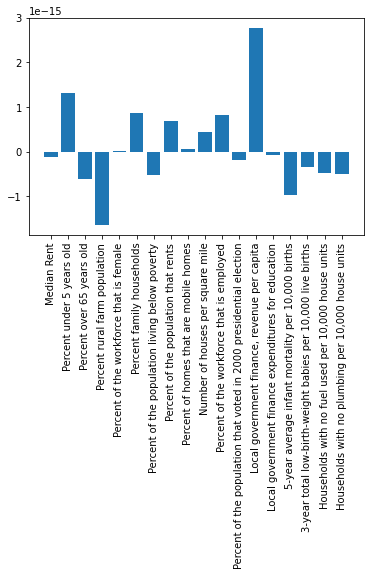

In [111]:
log_reg = LogisticRegression()
hyperparameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 500, 1000, 5000]
}

grid_search = GridSearchCV(log_reg, hyperparameters, cv=5)
grid_search.fit(Xac_train, yac_train)

print("Best hyperparameters: ", grid_search.best_params_)
log_reg = LogisticRegression(**grid_search.best_params_)
log_reg.fit(Xac_train, yac_train)

# Print the accuracy on test data
y_pred = log_reg.predict(Xac_test)
accuracy = accuracy_score(yac_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

# Get feature importances
importances = log_reg.coef_
importances_mean = np.mean(importances, axis=0)

# Print the feature importances in a column chart
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(data.columns, importances_mean, color='green')
ax.set_title("Feature Importances")
x_ticks = list(range(len(data.columns)))
ax.set_xticks(x_ticks)
ax.set_xticklabels(data.columns, rotation=45, ha='right')
plt.show()

## Support Vector Machines Algorithm

SVM (Support Vector Machine) classifier is a machine learning algorithm that uses a hyperplane to separate data into classes. It is a powerful and flexible classification technique that can be used for both linear and non-linear classification tasks. 

Pros:
- Effective in high-dimensional spaces and works well with a limited number of samples
- It can handle non-linear decision boundaries, thanks to the kernel trick
- The algorithm scales well with large datasets
- SVM models have good generalization performance, which means they perform well on unseen data.

Cons:
- It can be sensitive to the choice of kernel function and the regularization parameter
- SVM models can be computationally expensive to train, especially on large datasets
- SVM models are not very interpretable, meaning it can be difficult to understand how the model makes its predictions.

### Resilience Score

Best Hyperparameters:  {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
Accuracy on Test Data: 9.47%


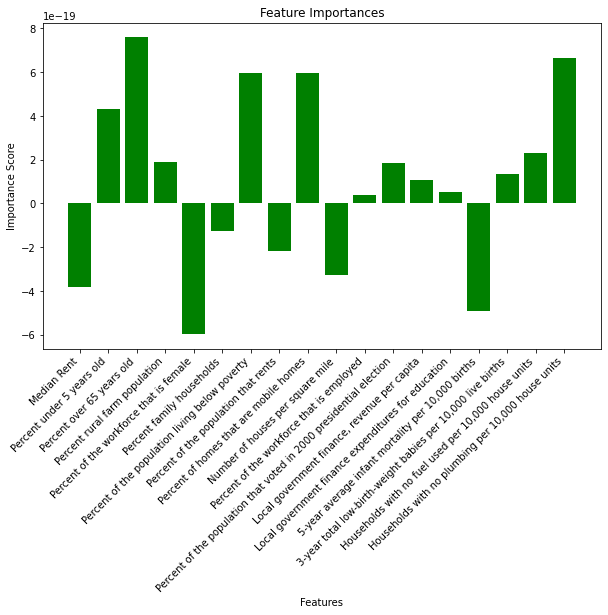

In [120]:
param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': ['scale', 'auto', 1, 0.1, 0.01, 0.001],
              'kernel': ['linear', 'rbf', 'sigmoid']}

# Creating SVM classifier
svc = SVC()

# Applying GridSearchCV for hyperparameter tuning
svm_grid = GridSearchCV(svc, param_grid, cv=5, n_jobs=-1)
svm_grid.fit(X_train, y_train)

# Getting the best SVM model
best_svc = svm_grid.best_estimator_

# Printing the best hyperparameters
print("Best Hyperparameters: ", svm_grid.best_params_)

# Predicting on test data
y_pred = best_svc.predict(X_test)

# Printing accuracy on test data
acc = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(acc*100))

# Plotting feature importances
result = permutation_importance(best_svc, X_test, y_test, n_repeats=10, random_state=random_state.value)
importances = result.importances_mean

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(data.columns, importances_mean, color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

### Vulnerability Index

Best Hyperparameters:  {'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}
Accuracy on Test Data: 21.40%


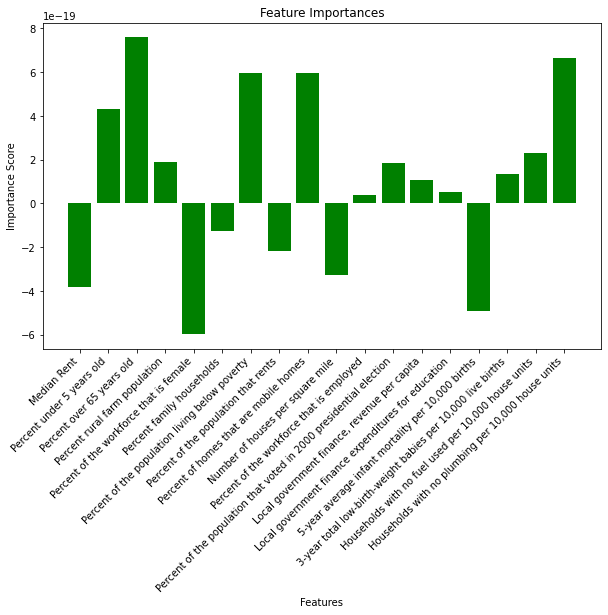

In [121]:
param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': ['scale', 'auto', 1, 0.1, 0.01, 0.001],
              'kernel': ['linear', 'rbf', 'sigmoid']}

# Creating SVM classifier
svc = SVC()

# Applying GridSearchCV for hyperparameter tuning
svm_grid = GridSearchCV(svc, param_grid, cv=5, n_jobs=-1)
svm_grid.fit(Xvc_train, yvc_train)

# Getting the best SVM model
best_svc = svm_grid.best_estimator_

# Printing the best hyperparameters
print("Best Hyperparameters: ", svm_grid.best_params_)

# Predicting on test data
y_pred = best_svc.predict(Xvc_test)

# Printing accuracy on test data
acc = accuracy_score(yvc_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(acc*100))

# Plotting feature importances
result = permutation_importance(best_svc, Xvc_test, yvc_test, n_repeats=10, random_state=random_state.value)
importances = result.importances_mean

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(data.columns, importances_mean, color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

### Adaptability Index

Best Hyperparameters:  {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
Accuracy on Test Data: 20.99%


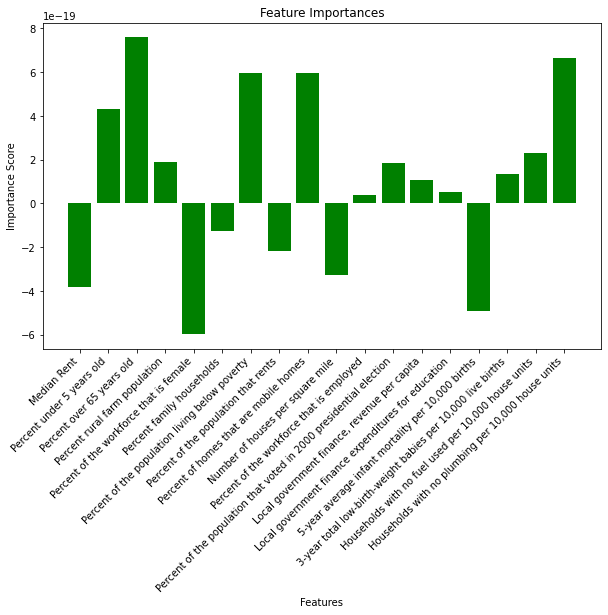

In [123]:
param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': ['scale', 'auto', 1, 0.1, 0.01, 0.001],
              'kernel': ['linear', 'rbf', 'sigmoid']}

# Creating SVM classifier
svc = SVC()

# Applying GridSearchCV for hyperparameter tuning
svm_grid = GridSearchCV(svc, param_grid, cv=5, n_jobs=-1)
svm_grid.fit(Xac_train, yac_train)

# Getting the best SVM model
best_svc = svm_grid.best_estimator_

# Printing the best hyperparameters
print("Best Hyperparameters: ", svm_grid.best_params_)

# Predicting on test data
y_pred = best_svc.predict(Xac_test)

# Printing accuracy on test data
acc = accuracy_score(yac_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(acc*100))

# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(data.columns, importances_mean, color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

## Random Forest Algorithm

### Resilience Score

Random Forest Classifier is a type of ensemble learning model that combines multiple decision trees to improve the accuracy and reduce overfitting. In Random Forest Classifier, each tree is built using a random subset of features and a random subset of data samples. The final prediction is made by aggregating the predictions of all the trees.

Pros:
- Handles high dimensional data well
- Can handle missing values and outliers
- Provides feature importance ranking
- Tends to perform well on a wide range of classification problems
- Reduces overfitting compared to individual decision trees

Cons:
- Can be slow for large datasets
- Interpretation of the model may be difficult due to the complexity of the model
- May not perform as well as other models such as support vector machines on some datasets.

Best hyperparameters:  {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


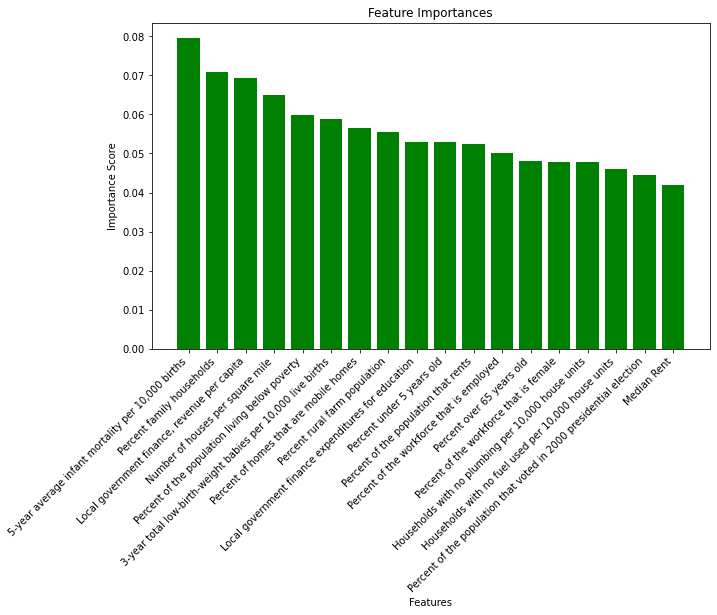

Accuracy on Test Data: 9.05%


In [127]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Random Forest Classifier
rf = RandomForestClassifier(random_state=random_state.value)

# Use GridSearchCV to find the best hyperparameters
rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
rf_grid.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters: ", rf_grid.best_params_)

# Train the model with the best hyperparameters
rf_best = RandomForestClassifier(**rf_grid.best_params_, random_state=random_state.value)
rf_best.fit(X_train, y_train)

# Get the feature importances
importances = rf_best.feature_importances_
feature_names = data.columns
importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importances_df.sort_values(by='Importance', ascending=False, inplace=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(importances_df['Feature'], importances_df['Importance'], color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

# Predict the test data and print the accuracy
y_pred = rf_best.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

### Vulnerability Index

Best hyperparameters:  {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


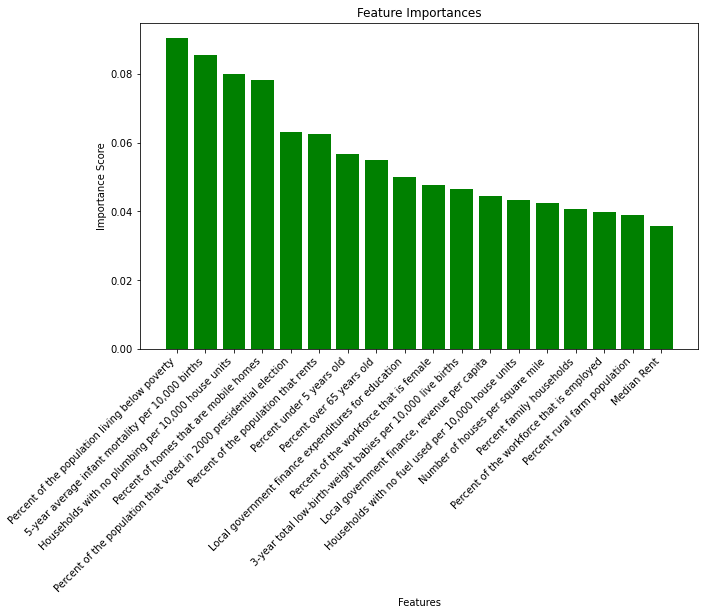

Accuracy on Test Data: 25.51%


In [128]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Random Forest Classifier
rf = RandomForestClassifier(random_state=random_state.value)

# Use GridSearchCV to find the best hyperparameters
rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
rf_grid.fit(Xvc_train, yvc_train)

# Print the best hyperparameters
print("Best hyperparameters: ", rf_grid.best_params_)

# Train the model with the best hyperparameters
rf_best = RandomForestClassifier(**rf_grid.best_params_, random_state=random_state.value)
rf_best.fit(Xvc_train, yvc_train)

# Get the feature importances
importances = rf_best.feature_importances_
feature_names = data.columns
importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importances_df.sort_values(by='Importance', ascending=False, inplace=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(importances_df['Feature'], importances_df['Importance'], color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

# Predict the test data and print the accuracy
y_pred = rf_best.predict(Xvc_test)
accuracy = accuracy_score(yvc_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

### Adaptability Index

Best hyperparameters:  {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


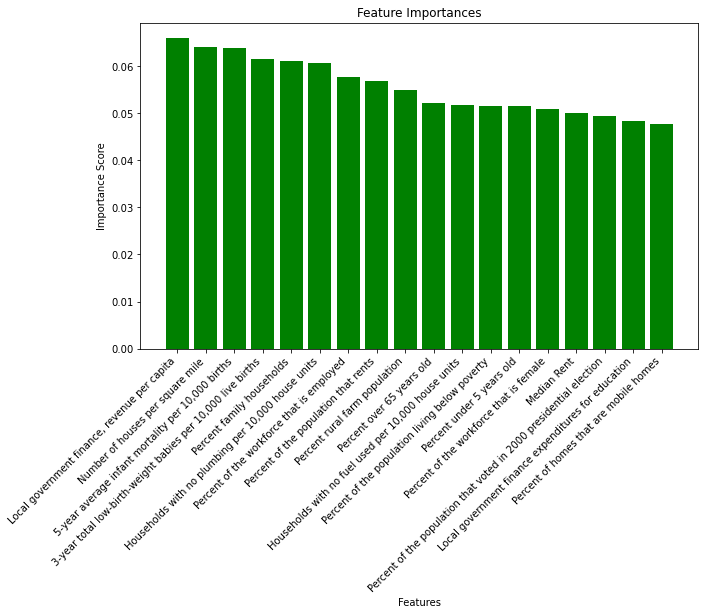

Accuracy on Test Data: 21.81%


In [129]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Random Forest Classifier
rf = RandomForestClassifier(random_state=random_state.value)

# Use GridSearchCV to find the best hyperparameters
rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
rf_grid.fit(Xac_train, yac_train)

# Print the best hyperparameters
print("Best hyperparameters: ", rf_grid.best_params_)

# Train the model with the best hyperparameters
rf_best = RandomForestClassifier(**rf_grid.best_params_, random_state=random_state.value)
rf_best.fit(Xac_train, yac_train)

# Get the feature importances
importances = rf_best.feature_importances_
feature_names = data.columns
importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importances_df.sort_values(by='Importance', ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.bar(importances_df['Feature'], importances_df['Importance'], color='green')
plt.xticks(rotation=45, ha='right')
plt.show()

# Predict the test data and print the accuracy
y_pred = rf_best.predict(Xac_test)
accuracy = accuracy_score(yac_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

## XGBoost Algorithm

XGBoost Classifier is a type of gradient boosting algorithm that is used for classification tasks. It is based on decision trees and combines the strengths of boosting and bagging techniques to improve model accuracy and reduce overfitting. The key features of XGBoost Classifier are:

Pros:
- Highly accurate: XGBoost Classifier is considered one of the most accurate classification algorithms.
- Fast and scalable: It can handle large datasets and can be parallelized on multiple CPU cores.
- Regularization: It has built-in regularization techniques to prevent overfitting.
- Feature importance: It provides a measure of feature importance, which can be used for feature selection.

Cons:
- Complexity: XGBoost Classifier is a complex algorithm and requires careful tuning of hyperparameters.
- Black-box model: The inner workings of XGBoost Classifier are not easily interpretable, making it difficult to understand how the model is making predictions.
- Imbalanced datasets: It may not perform well on imbalanced datasets without additional techniques such as oversampling or undersampling.

### Resilience Score

In [131]:
#!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 200.3 MB 17 kB/s                                | 880 kB 9.9 MB/s eta 0:00:21MB/s eta 0:00:20                             | 14.0 MB 9.9 MB/s eta 0:00:192 MB 9.9 MB/s eta 0:00:190.4 MB 20.3 MB/s eta 0:00:093.5 MB 20.3 MB/s eta 0:00:09 0:00:09                   | 32.7 MB 20.3 MB/s eta 0:00:09                   | 36.3 MB 20.3 MB/s eta 0:00:09                   | 37.7 MB 20.3 MB/s eta 0:00:09                 | 42.4 MB 20.9 MB/s eta 0:00:08           | 47.3 MB 20.9 MB/s eta 0:00:08MB 20.9 MB/s eta 0:00:08MB 20.9 MB/s eta 0:00:07                   | 57.2 MB 20.9 MB/s eta 0:00:07��████▌                      | 59.7 MB 18.5 MB/s eta 0:00:08�█▊                      | 60.8 MB 18.5 MB/s eta 0:00:08                   | 63.1 MB 18.5 MB/s eta 0:00:08MB 18.5 MB/s eta 0:00:08MB 18.5 MB/s eta 0:00:08                 | 68.3 MB 18.5 MB/s eta 0:00:08 18.5 MB/s eta 0:00:08��████▊            

Accuracy on Test Data: 8.23%


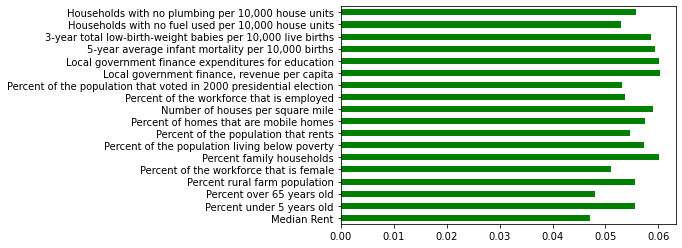

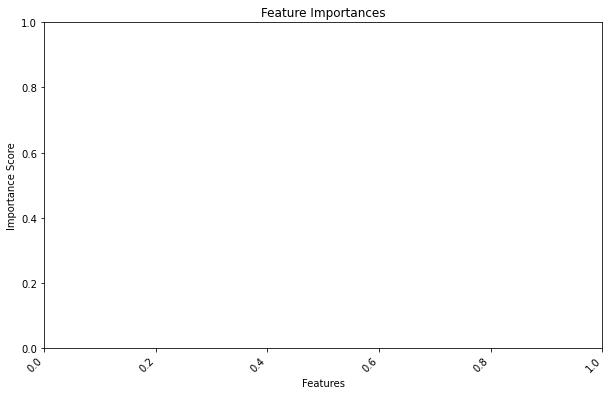

In [133]:
from xgboost import XGBClassifier

param_grid = {
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.05, 0.1, 0.3],
    'n_estimators': [50, 100, 200, 500]
}

# Creating the XGBoost Classifier object
xgb = XGBClassifier()
y_train = y_train-1
y_test = y_test-1
# Performing a grid search to find the best hyperparameters for the model
grid_search = GridSearchCV(xgb, param_grid, scoring='accuracy', n_jobs=-1, cv=5)
grid_result = grid_search.fit(X_train, y_train)

# Getting the best hyperparameters and creating the final model
best_params = grid_result.best_params_
final_model = XGBClassifier(**best_params)

# Fitting the final model on the training data
final_model.fit(X_train, y_train)

# Getting predictions on the test data
y_pred = final_model.predict(X_test)

# Calculating the accuracy score of the model on the test data
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

# Getting the feature importances and plotting them in a column chart
feature_importances = pd.Series(final_model.feature_importances_, index=data.columns)
plt.figure(figsize=(10, 6))
feature_importances.plot(kind='barh', color='green')
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.xticks(rotation=45, ha='right')
plt.show()

### Vulnerability Index

In [134]:
from xgboost import XGBClassifier

param_grid = {
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.05, 0.1, 0.3],
    'n_estimators': [50, 100, 200, 500]
}

# Creating the XGBoost Classifier object
xgb = XGBClassifier()
# Performing a grid search to find the best hyperparameters for the model
grid_search = GridSearchCV(xgb, param_grid, scoring='accuracy', n_jobs=-1, cv=5)
grid_result = grid_search.fit(Xvc_train, yvc_train)

# Getting the best hyperparameters and creating the final model
best_params = grid_result.best_params_
final_model = XGBClassifier(**best_params)

# Fitting the final model on the training data
final_model.fit(Xvc_train, yvc_train)

# Getting predictions on the test data
y_pred = final_model.predict(Xvc_test)

# Calculating the accuracy score of the model on the test data
accuracy = accuracy_score(yvc_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

# Getting the feature importances and plotting them in a column chart
feature_importances = pd.Series(final_model.feature_importances_, index=data.columns)
plt.figure(figsize=(10, 6))
feature_importances.plot(kind='barh', color='green')
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.xticks(rotation=45, ha='right')
plt.show()

ValueError: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2 3], got [1 2 3 4]

### Adaptability Index

In [ ]:
from xgboost import XGBClassifier

param_grid = {
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.05, 0.1, 0.3],
    'n_estimators': [50, 100, 200, 500]
}

# Creating the XGBoost Classifier object
xgb = XGBClassifier()

# Performing a grid search to find the best hyperparameters for the model
grid_search = GridSearchCV(xgb, param_grid, scoring='accuracy', n_jobs=-1, cv=5)
grid_result = grid_search.fit(Xac_train, yac_train)

# Getting the best hyperparameters and creating the final model
best_params = grid_result.best_params_
final_model = XGBClassifier(**best_params)

# Fitting the final model on the training data
final_model.fit(Xac_train, yac_train)

# Getting predictions on the test data
y_pred = final_model.predict(Xac_test)

# Calculating the accuracy score of the model on the test data
accuracy = accuracy_score(yac_test, y_pred)
print("Accuracy on Test Data: {:.2f}%".format(accuracy*100))

# Getting the feature importances and plotting them in a column chart
feature_importances = pd.Series(final_model.feature_importances_, index=data.columns)
plt.figure(figsize=(10, 6))
feature_importances.plot(kind='barh', color='green')
plt.title("Feature Importances")
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.xticks(rotation=45, ha='right')
plt.show()

---